In [254]:
from pathlib import Path
root_path = Path("/home/ubuntu/sr")

In [255]:
assert(root_path.exists())

In [256]:
%load_ext autoreload
%autoreload 2
from srgan.train import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [257]:
from srgan.checkpoint import *
from srgan.models import *

In [258]:
# load_checkpoint?

In [259]:
device = torch.device("cpu")
print(device)    

cpu


In [429]:
upscale_factor = 4
image_channels = 3
residual_block_channels = 64
num_residual_blocks = 16
num_middle_blocks = 7

generator = Generator(upscale_factor=upscale_factor,
                        image_channels=image_channels,
                        residual_block_channels=residual_block_channels,
                        num_residual_blocks=num_residual_blocks).to(device)

discriminator = Discriminator(
        image_channels=image_channels,
        num_middle_blocks=num_middle_blocks).to(device)


In [430]:
generator, discriminator = load_checkpoint(generator, discriminator, "/home/ubuntu/sr/model_checkpoint/aishu/srgan_v0.pth", device)

In [431]:
valid_dataset = SRImageDataset("/home/ubuntu/sr/test_data/", is_valid=True)

In [432]:
lr_norm, hr, lr = valid_dataset[0]
lr_norm.shape, hr.shape, lr.shape

(torch.Size([3, 408, 510]),
 torch.Size([3, 1632, 2040]),
 torch.Size([3, 408, 510]))

In [433]:
generator.eval()
out = generator(lr_norm.unsqueeze(0).to(device)).to("cpu").squeeze(0)
# F.mse_loss(out, hr)

In [434]:
from torchvision.transforms import ToTensor, ToPILImage

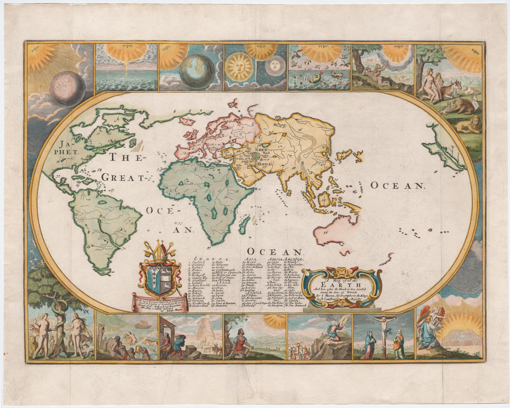

In [435]:
ToPILImage()(lr)

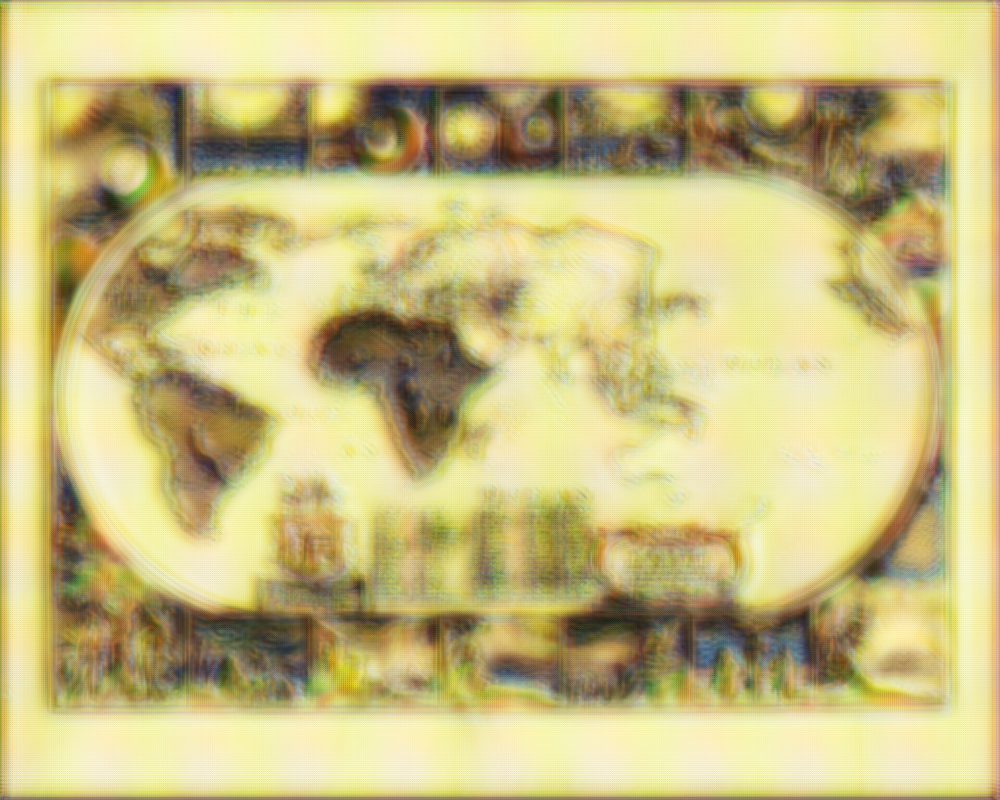

In [436]:
output_to_pil_image(out)

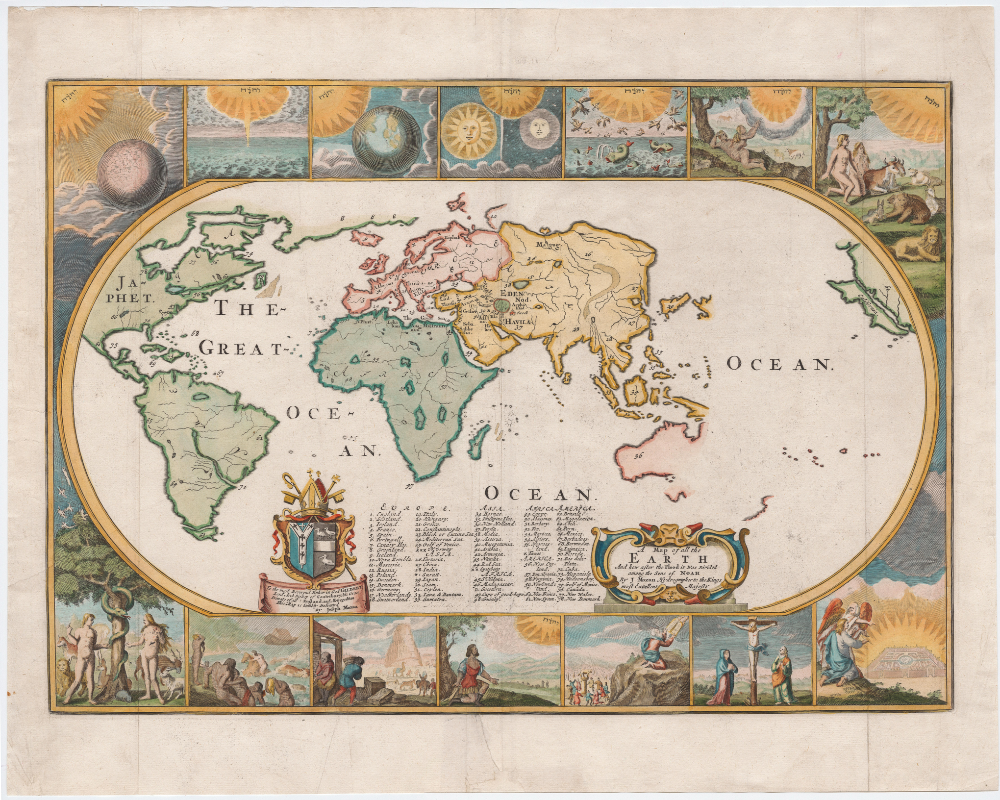

In [437]:
ToPILImage()(hr)

In [438]:
lr_norm.shape, hr.shape, out.shape, lr.shape

(torch.Size([3, 408, 510]),
 torch.Size([3, 1632, 2040]),
 torch.Size([3, 1632, 2040]),
 torch.Size([3, 408, 510]))

In [439]:
import torch
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def convert_image(img, source, target):
    device = torch.device("cpu")
    rgb_weights = torch.FloatTensor([65.481, 128.553, 24.966]).to(device)
    if source == '[-1, 1]':
        img = (img + 1.0) / 2.0

    if target == 'y-channel':
        img = torch.matmul(255. * img.permute(0, 2, 3, 1)[:, 4:-4, 4:-4, :], rgb_weights) / 255. + 16.0

    return img

In [440]:
sr_y = convert_image(out.unsqueeze(0), source='[-1, 1]', target='y-channel').squeeze(0)
hr_y = convert_image(hr.unsqueeze(0), source='[-1, 1]', target='y-channel').squeeze(0)

hr_y = hr_y.detach().cpu().numpy()
sr_y = sr_y.detach().cpu().numpy()

psnr = peak_signal_noise_ratio(hr_y, sr_y, data_range=255.)
ssim = structural_similarity(hr_y, sr_y,data_range=255.)

print('PSNR - {0:.3f}'.format(psnr))
print('SSIM - {0:.3f}'.format(ssim))

PSNR - 14.595
SSIM - 0.270


In [441]:
del lr_norm, hr, lr, out

In [442]:
del valid_dataset, generator